# Import libraries

In [1]:
import pandas as pd
import numpy as np
import logging

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.dates as mdates
from matplotlib.colors import ListedColormap


import plotly.express as px
import folium

from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.neighbors import BallTree

import joblib

import time
import os

#Configure logging

In [2]:
# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# Import Data

In [3]:
def import_data(file_path):
    try:
        # Read data from the specified file path
        df_raw = pd.read_csv(file_path)
        logging.info("Data imported successfully from %s", file_path)
        return df_raw
    except FileNotFoundError:
        logging.error("File not found: %s", file_path)
        return None
    except Exception as e:
        logging.error("Error occurred while importing data from %s: %s", file_path, e)
        return None

# Cleaning Data

In [4]:
def reduce_sampling_rate(df):
    try:
        df.set_index('Timestamp', inplace=True)
        logging.info("Index set to 'Timestamp' column")
        
        df_resampled = df.resample('s').first()
        logging.info("Data resampled successfully")
        
        df_resampled.reset_index(inplace=True)
        logging.info("Index reset to create a standard numerical index")
        
        return df_resampled
    except Exception as e:
        logging.error("Error occurred while reducing sampling rate: %s", e)
        return None

# Feature Engineering

In [5]:

def add_engineered_features(df, alt_threshold=20, speed_threshold=3, inplace=False):
    """
    Calculate the altitude change, speed change, and course change between consecutive rows and remove outliers.

    Args:
        df (pd.DataFrame): DataFrame containing the altitude, speed, and course data.
        alt_threshold (float): Threshold value for altitude change outlier detection.
        speed_threshold (float): Threshold value for speed change outlier detection.
        inplace (bool): Whether to modify the original DataFrame or create a copy.

    Returns:
        tuple: A tuple containing the modified DataFrame and a dictionary with shape information.
    """
    # Check if required columns exist
    required_columns = ['Alt(m)', 'Speed(m/s)', 'Course']
    if not all(col in df.columns for col in required_columns):
        logger.error("Required columns not found in DataFrame.")
        return None, {}

    # Store the initial DataFrame size
    initial_size = len(df)

    # Calculate changes
    df['Alt(m)_change'] = df['Alt(m)'].diff().fillna(0)
    df['Speed(m/s)_change'] = df['Speed(m/s)'].diff().fillna(0)
    df['Course_change'] = df['Course'].diff().fillna(0)

    # Remove outliers
    mask = (df['Alt(m)_change'].abs() <= alt_threshold) & \
           (df['Speed(m/s)_change'].abs() <= speed_threshold)
    filtered_df = df[mask] if inplace else df.copy()[mask]

    # Reset the index of the filtered DataFrame and drop null values
    filtered_df = filtered_df.dropna()
    filtered_df = filtered_df.reset_index(drop=True)

    # Log the shape after outlier removal
    logger.info("Shape before outlier removal: %d", initial_size)
    logger.info("Shape after outlier removal: %d", len(filtered_df))

    return filtered_df

In [6]:
def convert_datetime(df, inplace=False):
    """
    Convert the 'Timestamp' column in a DataFrame to datetime format.

    Args:
        df (pd.DataFrame): DataFrame containing the 'Timestamp' column.
        inplace (bool): Whether to modify the original DataFrame or create a copy.

    Returns:
        pd.DataFrame: The DataFrame with the 'Timestamp' column converted to datetime format.
    """
    try:
        # Check if 'Timestamp' column exists
        if 'Timestamp' not in df.columns:
            raise ValueError("Column 'Timestamp' not found in DataFrame.")

        # Convert 'Timestamp' column to datetime format
        if inplace:
            df['Timestamp'] = pd.to_datetime(df['Timestamp'], unit='ns')
        else:
            df = df.copy()
            df['Timestamp'] = pd.to_datetime(df['Timestamp'], unit='ns')

        logging.info("Timestamp column converted to datetime format successfully.")
        return df
    except ValueError as ve:
        logging.error("ValueError occurred: %s", ve)
        return None
    except Exception as e:
        logging.error("Error occurred while converting timestamp to datetime: %s", e)
        return None

# Prediction

In [7]:
def load_model(file_path_to_model):
    try:
        # Load the saved model
        model = joblib.load(file_path_to_model)
        logging.info("Model loaded successfully from %s", file_path_to_model)
        return model
    except FileNotFoundError:
        logging.error("File not found: %s", file_path_to_model)
        return None
    except Exception as e:
        logging.error("Error occurred while loading model from %s: %s", file_path_to_model, e)
        return None


In [8]:
def show_hyperparameters(model):
    # show hyperparameters
    return model.get_params()


In [9]:
def predict_on_features(model, df):
    """
    Select a subset of features from a DataFrame and make a prediction based on those features, returns full dataframe including prediction.

    Args:
        df (pd.DataFrame): DataFrame containing the features.

    Returns:
        pd.DataFrame: A DataFrame containing only the selected features.
    """
    try:
        # Define features to use
        features_to_use = ['accelX(g)', 'accelY(g)', 'accelZ(g)', 'accelUserX(g)', 'accelUserY(g)',
                           'accelUserZ(g)', 'gyroX(rad/s)', 'gyroY(rad/s)', 'gyroZ(rad/s)',
                           'Roll(rads)', 'Pitch(rads)', 'Yaw(rads)', 'Lat', 'Long', 'Speed(m/s)',
                           'HorizontalAccuracy(m)', 'VerticalAccuracy(m)', 'Course', 'calMagX(µT)',
                           'calMagY(µT)', 'calMagZ(µT)', 'Alt(m)_change',
                           'Speed(m/s)_change', 'Course_change']

        # Check if all features exist in the DataFrame
        missing_features = [feature for feature in features_to_use if feature not in df.columns]
        if missing_features:
            raise ValueError(f"Features not found in DataFrame: {missing_features}")

        # Select the features
        X = df.copy()[features_to_use]

        # Predict on selected features
        predictions = model.predict(X)
        df.loc[:, 'predicted'] = predictions

        logging.info("Prediction made successfully")
        return df
    except ValueError as ve:
        logging.error("ValueError occurred: %s", ve)
        return None
    except Exception as e:
        logging.error("Error occurred while making prediction: %s", e)
        return None

# Visualisation

### Plotting

In [10]:
def plot_prediction(df, target_column='predicted', cmap=None):
    try:
        # Define the plot title based on the target column
        if target_column == 'on_lift':
            plot_title = 'Predictions'
        elif target_column == 'mask':
            plot_title = 'Clean Predictions with mask'
        elif target_column == 'event':
            plot_title = 'Lift Events'
        else:
            plot_title = 'Predictions'

        # Use the passed colormap if available, otherwise use the default
        if cmap is None:
            dark2_cmap = ListedColormap(plt.cm.Dark2(range(8)))
            cmap = {str(idx): color for idx, color in enumerate(dark2_cmap.colors)}

        # Check if 'Timestamp' column exists and is in datetime format
        if 'Timestamp' in df.columns and pd.api.types.is_datetime64_any_dtype(df['Timestamp']):
            # Create a scatter plot for Altitude over Time, colored by target_column with an accessible color scheme
            fig = px.scatter(df, x='Timestamp',
                             y='Alt(m)', color=target_column,
                             labels={'Alt(m)': 'Altitude (m)'},
                             title=plot_title,
                             color_discrete_map=cmap)

            fig.update_traces(marker=dict(size=8),
                              selector=dict(mode='markers'))

            # Customize the legend
            fig.update_layout(
                legend_title_text='Status',
                width=1000,
                height=600
            )

            # Update legend labels based on target_column
            if target_column == 'on_lift':
                fig.for_each_trace(lambda trace: trace.update(name='Not on the lift' if trace.name == '0' else 'On the lift'))
            # Add more conditions if there are different classes for other target_columns

            # Show the plot
            fig.show()
        else:
            logging.warning("DataFrame's 'Timestamp' column is not in datetime format and must be converted first.")
    except Exception as e:
        logging.error("Error occurred while plotting prediction: %s", e)



In [11]:
def plot_total_alt_over_time(df, plot_title='Total Tracked Altitude Over Time'):

    # Create a line plot using Plotly
    fig = go.Figure()

    # Add a trace for altitude over time
    fig.add_trace(go.Scatter(x=df['Timestamp'],
                             y=df['Alt(m)'],
                             mode='lines',
                             name='Altitude'))

    # Update layout
    fig.update_layout(title=plot_title,
                      xaxis_title='Timestamp',
                      yaxis_title='Altitude (m)')

    # Show plot
    fig.show()

### Mapping

In [12]:
#Map all tracked movement based on lat and long of GPS data

def map_tracked_movement(df, zoom_start=12):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    movement_on_map = folium.Map(location=map_center, zoom_start=zoom_start)

    # Add CircleMarkers for each data point
    for index, row in df.iterrows():
        folium.CircleMarker(location=[row['Lat'], row['Long']], radius=5, color='blue', fill=True, fill_color='blue').add_to(movement_on_map)

    # Display the map
    return movement_on_map

In [13]:
def map_lifts_and_other_movement(df, column='on_lift', zoom_start=15):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    tracking_map = folium.Map(location=map_center, zoom_start=zoom_start, width=800, height=800)

    # Add grayscale tile layer with attribution
    folium.TileLayer('cartodbpositron').add_to(tracking_map)

    # Plot data points with not_on_lift  types
    not_on_lift = df[df[column] != 1]
    for _, row in not_on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'], row['Long']], radius=2, color='ligtgrey', fill=True, fill_color='ligtgrey', tooltip=str(row['Timestamp'])).add_to(tracking_map)

    # Plot data points with on_lift type
    on_lift = df[df[column] == 1]
    for _, row in on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'], row['Long']], 
                            radius=0.5, 
                            color='#d95f02', 
                            fill=True, 
                            fill_color='#d95f02', 
                            # opacity=0.5,
                            # fill_opacity=0.5,
                            tooltip=str(row['Timestamp'])).add_to(tracking_map)
    
    # Return the map object
    return tracking_map

In [14]:
#Map only lifts rides

def map_lift_rides(df, column='on_lift', zoom_start=15):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    lift_map = folium.Map(location=map_center, zoom_start=zoom_start)

    # Plot data points with on_lift type
    on_lift = df[df[column] == 1]
    for _, row in on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                                      radius=5,
                                      color='red',
                                      fill=True,
                                      fill_color='red',
                                      tooltip=str(row['Timestamp'])).add_to(lift_map)

    # Return the map object
    return lift_map

# Post-Processing

In [15]:
def generate_misclassification_mask(df, column_to_mask='predicted', chunk_size=60, threshold=0.3):
    """
    Apply a binary mask to each row in a DataFrame based on the average value of a specified column in chunks.

    Args:
        df (pd.DataFrame): DataFrame containing the data.
        column_to_mask (str): Name of the column to calculate the mean and apply the mask.
        chunk_size (int): Size of the chunks to divide the DataFrame into.
        threshold (float): Threshold value for determining the mask value.

    Returns:
        tuple: A tuple containing the updated DataFrame with the mask applied and the event log.
    """
    try:
        # Check if the 'mask' column already exists
        if 'mask' in df.columns:
            raise ValueError("The 'mask' column already exists in the DataFrame.")

        # Initialize the event log
        event_log = {}

        # Calculate the total number of chunks
        total_chunks = len(df) // chunk_size
        remainder = len(df) % chunk_size

        # Process each chunk
        for i in range(total_chunks):
            start_index = i * chunk_size
            end_index = start_index + chunk_size

            # Calculate the mean of the chunk and create the mask
            mean_value = df[column_to_mask].iloc[start_index:end_index].mean()
            mask_value = 1 if mean_value >= threshold else 0

            # Update the DataFrame with the mask value
            df.loc[start_index:end_index, 'mask'] = mask_value

            # Record the event log
            event_log[i] = (start_index, end_index, mask_value)

        # Process the remainder if any
        if remainder > 0:
            start_index = total_chunks * chunk_size
            end_index = len(df)

            # Calculate the mean of the remainder and create the mask
            mean_value = df[column_to_mask].iloc[start_index:end_index].mean()
            mask_value = 1 if mean_value >= threshold else 0

            # Update the DataFrame with the mask value
            df.loc[start_index:end_index, 'mask'] = mask_value

            # Record the event log for the remainder
            event_log[total_chunks] = (start_index, end_index, mask_value)

        # Log the success
        logging.info("Misclassification mask generated successfully.")

        # Return the updated DataFrame and the event log
        return df, event_log
    except ValueError as ve:
        logging.error("ValueError occurred: %s", ve)
        return None, None
    except Exception as e:
        logging.error("Error occurred while generating misclassification mask: %s", e)
        return None, None

In [16]:
def on_lift_event_identification(df, event_log):
    try:
        # Validate the event log
        if not isinstance(event_log, dict) or not all(isinstance(v, tuple) and len(v) == 3 for v in event_log.values()):
            raise ValueError("Invalid event log format.")

        continuous_events_dict = {}
        event_index = 1

        start = None
        end = None

        for key in sorted(event_log.keys()):
            if event_log[key][2] > 0:
                if start is None:
                    start = event_log[key][0]
                    end = event_log[key][1]
                elif end == event_log[key][0]:
                    end = event_log[key][1]
                else:
                    continuous_events_dict[event_index] = (start, end)
                    event_index += 1
                    start, end, _ = event_log[key]

        continuous_events_dict[event_index] = (start, end)
        event_index += 1
        start = None
        end = None

        # Assign event labels to the DataFrame
        df['event'] = 0
        for label in continuous_events_dict:
            range_val = [x for x in range(continuous_events_dict[label][0], continuous_events_dict[label][1] + 1)]
            df.loc[range_val, 'event'] = label

        logging.info("On-lift event identification completed successfully.")

        return df, continuous_events_dict
    except ValueError as ve:
        logging.error("ValueError occurred: %s", ve)
        return None, None
    except Exception as e:
        logging.error("Error occurred while identifying on-lift events: %s", e)
        return None, None


# UX

In [17]:
def count_number_of_rides_per_lift(df, lifts_db):
    try:
        # Initialise counter for lift usage
        lift_usage_counter = {}

        # Group df by 'event' column
        df_grouped = df.groupby('event')

        # Iterate over each group
        for event, group in df_grouped:
            # Extract start and end coordinates from the first and last rows of the group
            start_row = group.iloc[0]
            end_row = group.iloc[-1]

            # Extract start coordinates of events
            start_coords = (start_row['Lat'], start_row['Long'])

            # Convert start coordinates to radians
            start_coords_rad = np.radians([start_coords])

            # get hold of start and end alt
            start_alt = start_row['Alt(m)']
            end_alt = end_row['Alt(m)']

            # compare start_alt and end_alt to decide if start_coords should be compared to top_coord or base_coord
            if start_alt < end_alt:
                # Convert lift base locations to radians
                lift_base_locations_rad = np.radians([[lift['base_latitude'], lift['base_longitude']] for _, lift in lifts_db.iterrows()])
                # Use BallTree to find the nearest lift for the start coordinates
                base_tree = BallTree(lift_base_locations_rad, metric='haversine')
                _, base_indices = base_tree.query(start_coords_rad, k=1)
                # Get the lift name for the nearest lift to the start coordinates
                base_lift_name = lifts_db.iloc[base_indices.flatten()[0]]['lift_name']
                # Update lift usage counter
                lift_usage_counter[base_lift_name] = lift_usage_counter.get(base_lift_name, 0) + 1
            elif start_alt > end_alt:
                # Convert lift top locations to radians
                lift_top_locations_rad = np.radians([[lift['top_latitude'], lift['top_longitude']] for _, lift in lifts_db.iterrows()])
                # Use BallTree to find the nearest lift for the start coordinates
                top_tree = BallTree(lift_top_locations_rad, metric='haversine')
                _, top_indices = top_tree.query(start_coords_rad, k=1)
                # Get the lift name for the nearest lift to the start coordinates
                top_lift_name = lifts_db.iloc[top_indices.flatten()[0]]['lift_name']
                # Update lift usage counter
                lift_usage_counter[top_lift_name] = lift_usage_counter.get(top_lift_name, 0) + 1

        # Print lift usage information
        print("Lifts used today:\n")
        for lift_name, count in lift_usage_counter.items():
            print(f"Lift {lift_name} was used {count} times.")
    except Exception as e:
        logging.error("Error occurred while counting number of rides per lift: %s", e)

In [18]:
def UX_count_number_of_rides_per_lift(df, lifts_db):
    try:
        # Filter out events with ID 0
        df = df[df['event'] != 0]

        # Initialise counter for lift usage
        lift_usage_counter = {}

        # Group df by 'event' column
        df_grouped = df.groupby('event')

        # Iterate over each group
        for event, group in df_grouped:
            # Extract start and end coordinates from the first and last rows of the group
            start_row = group.iloc[0]
            end_row = group.iloc[-1]

            # Extract start coordinates of events
            start_coords = (start_row['Lat'], start_row['Long'])

            # Convert start coordinates to radians
            start_coords_rad = np.radians([start_coords])

            # get hold of start and end alt
            start_alt = start_row['Alt(m)']
            end_alt = end_row['Alt(m)']

            # compare start_alt and end_alt to decide if start_coords should be compared to top_coord or base_coord
            if start_alt < end_alt:
                # Convert lift base locations to radians
                lift_base_locations_rad = np.radians([[lift['base_latitude'], lift['base_longitude']] for _, lift in lifts_db.iterrows()])
                # Use BallTree to find the nearest lift for the start coordinates
                base_tree = BallTree(lift_base_locations_rad, metric='haversine')
                _, base_indices = base_tree.query(start_coords_rad, k=1)
                # Get the lift name for the nearest lift to the start coordinates
                base_lift_name = lifts_db.iloc[base_indices.flatten()[0]]['lift_name']
                # Update lift usage counter
                lift_usage_counter[base_lift_name] = lift_usage_counter.get(base_lift_name, 0) + 1
            elif start_alt > end_alt:
                # Convert lift top locations to radians
                lift_top_locations_rad = np.radians([[lift['top_latitude'], lift['top_longitude']] for _, lift in lifts_db.iterrows()])
                # Use BallTree to find the nearest lift for the start coordinates
                top_tree = BallTree(lift_top_locations_rad, metric='haversine')
                _, top_indices = top_tree.query(start_coords_rad, k=1)
                # Get the lift name for the nearest lift to the start coordinates
                top_lift_name = lifts_db.iloc[top_indices.flatten()[0]]['lift_name']
                # Update lift usage counter
                lift_usage_counter[top_lift_name] = lift_usage_counter.get(top_lift_name, 0) + 1

        logging.info("Lift usage counter generated successfully.")
        return lift_usage_counter
    except Exception as e:
        logging.error("Error occurred while counting number of rides per lift: %s", e)
        return {}

In [19]:
def alt_climbed_on_lift(lifts_db, lift_usage_counter):
    try:
        total_alt = 0 

        for lift_name, count in lift_usage_counter.items():
            lift_data = lifts_db[lifts_db['lift_name'] == lift_name]
            lift_length = lift_data['top_station(m)'].iloc[0] - lift_data['base_station(m)'].iloc[0]
            total_alt += lift_length * int(count)

        logging.info("Total altitude climbed on lifts calculated successfully.")
        return total_alt
    except Exception as e:
        logging.error("Error occurred while calculating total altitude climbed on lifts: %s", e)
        return 0


# Prediction steps in one function

In [20]:
def predict_on_data(path_to_csv_file, file_path_to_model):
    """
    Predict on a CSV file that already contains all data points.

    Args:
        path_to_csv_file (str): File path to the CSV file containing the data.
        file_path_to_model (str): File path to the trained model.

    Returns:
        pd.DataFrame: DataFrame containing the predictions.
    """
    try:
        # Load the data
        df = pd.read_csv(path_to_csv_file)

        # Preprocess and feature engineering
        df = convert_datetime(df)
        df = reduce_sampling_rate(df)
        df = add_engineered_features(df)

        # Load the model
        rfc = joblib.load(file_path_to_model)

        # Make predictions
        df = predict_on_features(rfc, df)

        # Update predictions with mask
        df, event_log = generate_misclassification_mask(df)

        # Generate on-lift event assignments
        df, continuous_events_dict = on_lift_event_identification(df, event_log)

        # Plot predictions
        plot_prediction(df, target_column='mask')
        plot_prediction(df, target_column='event')

        logging.info("Prediction on data completed successfully.")
        return df

    except FileNotFoundError as e:
        logging.error("File not found: %s", e)
        return pd.DataFrame()
    except Exception as e:
        logging.error("An error occurred during prediction on data: %s", e)
        return pd.DataFrame()

# "Real time" prediction simulation

In [21]:
class DataAnimation:
    def __init__(self, df, file_path_to_model):
        """
        Initialize the DataAnimation class.

        Args:
            df (pd.DataFrame): DataFrame containing the data.
            file_path_to_model (str): File path to the trained model.
        """
        try:
            self.df = df
            self.file_path_to_model = file_path_to_model
            self.chunk_size = 60
            self.data_agg = pd.DataFrame()
            self.fig, self.ax = plt.subplots()
            self.data_generator = self.get_next_chunk(self.df, self.chunk_size)
            self.total_chunks = len(df) // self.chunk_size
            self.ani = animation.FuncAnimation(self.fig, self.update, frames=self.total_chunks, interval=200, blit=False, repeat=False)
            plt.show()
            logging.info("DataAnimation initialized successfully.")
        except Exception as e:
            logging.error("An error occurred during initialization: %s", e)

    def update(self, i):   
        """
        Update function for the animation.

        Args:
            i (int): Frame index.
        """
        try:
            # Get the next chunk of data
            data_chunk = next(self.data_generator)
            processed_chunk = self.complete_pipeline(data_chunk, self.file_path_to_model)

            # Concatenate the processed chunk with the aggregated data
            self.data_agg = pd.concat([self.data_agg, processed_chunk])

            # Update the plot with the new data
            sc = self.ax.scatter(self.data_agg['Timestamp'], self.data_agg['Alt(m)'], c=self.data_agg['color'])

            # Set the axes limits dynamically based on the new data
            x_min = self.data_agg['Timestamp'].min() - pd.Timedelta(minutes=5)
            x_max = self.data_agg['Timestamp'].max() + pd.Timedelta(minutes=5)
            y_min = self.data_agg['Alt(m)'].min() - 100
            y_max = self.data_agg['Alt(m)'].max() + 100

            # Set the axes limits if necessary
            self.ax.set_xlim([x_min, x_max])
            self.ax.set_ylim([y_min, y_max])

            # Update the x-axis major locator and formatter
            self.ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

            # Set tick mark angle
            plt.setp(self.ax.get_xticklabels(), rotation=45, ha='right')

            # Add labels and title if necessary
            self.ax.set_title(f'Real-time Data Analysis (minute: {i})')
            self.ax.set_xlabel('Time')
            self.ax.set_ylabel('Altitude (m)')

            # Add legend with custom labels
            legend_labels = {'red': 'on_lift'}
            self.ax.legend(handles=sc.legend_elements()[0], labels=legend_labels)

            # Return the scatter plot object to blit
            return sc
        except Exception as e:
            logging.error("An error occurred during animation update: %s", e)

    def complete_pipeline(self, data_chunk, file_path_to_model):
        """
        Perform the complete processing pipeline on a data chunk.

        Args:
            data_chunk (pd.DataFrame): DataFrame containing the data chunk.
            file_path_to_model (str): File path to the trained model.

        Returns:
            pd.DataFrame: DataFrame containing the processed data chunk.
        """
        try:
            # Define colors for the categories
            colors = {1: 'red', 0: 'blue'}

            df = add_engineered_features(data_chunk)
            df = convert_datetime(df)
            features = select_features(df)
            rfc = load_model(file_path_to_model)
            df = predict_on_features(rfc, df, features)
            df, event_log = generate_misclassification_mask(df)
            df['color'] = df['mask'].map(colors)

            logging.info("Data chunk processed successfully.")
            return df
        except Exception as e:
            logging.error("An error occurred during data chunk processing: %s", e)

    def get_next_chunk(self, df, chunk_size):
        """
        Generator function to yield the next chunk of data.

        Args:
            df (pd.DataFrame): DataFrame containing the data.
            chunk_size (int): Size of each data chunk.

        Yields:
            pd.DataFrame: Next chunk of data.
        """
        try:
            total_chunks = len(df) // chunk_size
            for i in range(total_chunks):
                start_index = i * chunk_size
                end_index = start_index + chunk_size
                data_chunk = df.iloc[start_index:end_index]
                yield data_chunk
        except Exception as e:
            logging.error("An error occurred during chunk generation: %s", e)

# To do before going for one of the options

Make sure that you specify the paths and other variables needed

In [22]:
current_dir = os.getcwd()  # Get the current working directory
parent_dir = os.path.abspath(os.path.join(current_dir, ".."))

In [23]:
# Run predictions on this file/df
path_to_csv_file = os.path.join(parent_dir, "data", "raw", "v5_20230407_091351_95m.csv")
file_path_to_model = os.path.join(parent_dir, "models", "rf_v_0.4.pkl")

In [24]:
# Load the lifts_db
# path to file
file_lift_db= os.path.join(current_dir, "..", "data", "lifts_db_v0.1.csv")
# Load df
lifts_db = pd.read_csv(file_lift_db)

2024-02-19 12:29:11,623 - INFO - Timestamp column converted to datetime format successfully.
2024-02-19 12:29:11,627 - INFO - Index set to 'Timestamp' column
2024-02-19 12:29:11,644 - INFO - Data resampled successfully
2024-02-19 12:29:11,647 - INFO - Index reset to create a standard numerical index
2024-02-19 12:29:11,678 - INFO - Shape before outlier removal: 5739
2024-02-19 12:29:11,679 - INFO - Shape after outlier removal: 5653
2024-02-19 12:29:12,212 - INFO - Prediction made successfully
2024-02-19 12:29:12,319 - INFO - Misclassification mask generated successfully.
2024-02-19 12:29:12,331 - INFO - On-lift event identification completed successfully.


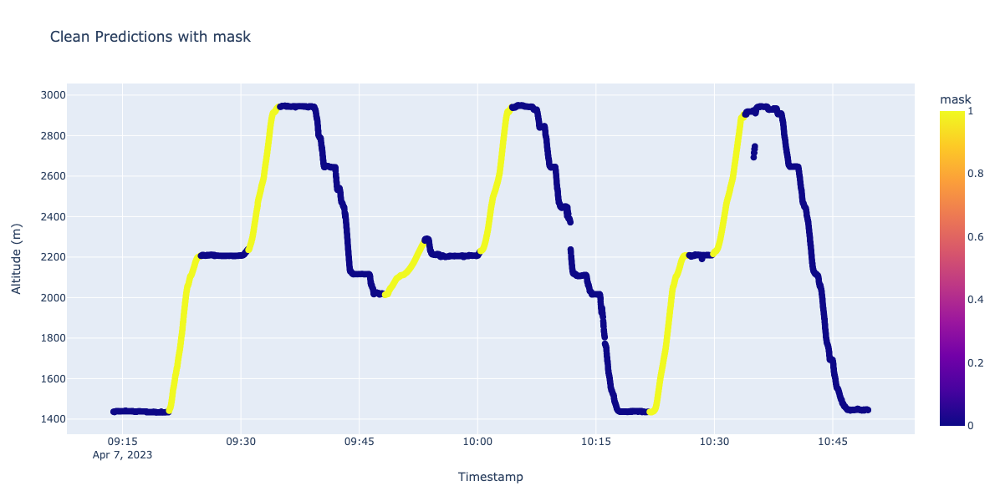

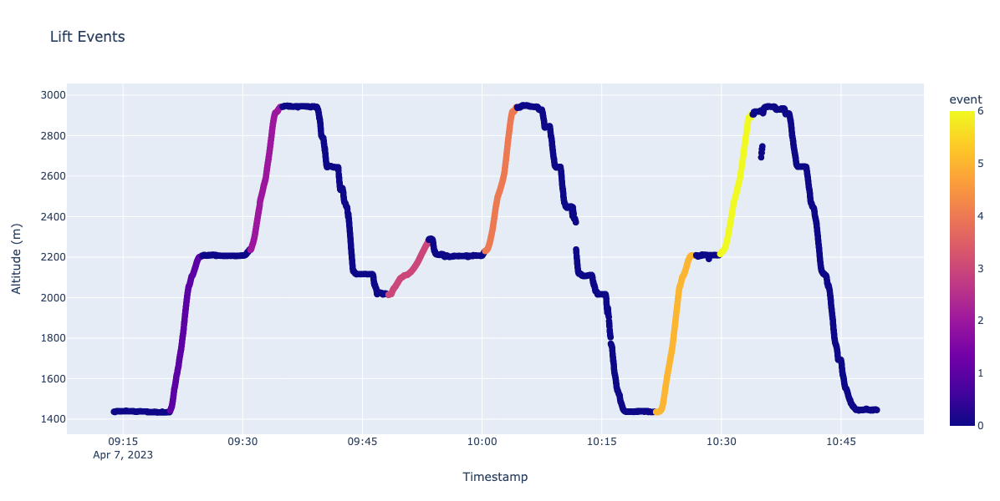

2024-02-19 12:29:13,452 - INFO - Prediction on data completed successfully.


In [31]:
df=predict_on_data(path_to_csv_file,file_path_to_model)

In [77]:
map=map_lifts_and_other_movement(df,column='mask')
map

# Option 1: 'Real time' prediction

In [172]:
# # Call this function to simulate prediction in 'real time'
matplotlib.use('TkAgg')
df_option1=import_data(path_to_csv_file)
data_anim = DataAnimation(df_option1, file_path_to_model)

2024-02-16 17:31:02,658 - INFO - Data imported successfully from c:\Users\sebas\Documents\Constructor Academy\alturos\data\raw\v5_20230407_091351_95m.csv
C:\Users\sebas\AppData\Local\Temp\ipykernel_15340\1957079997.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\sebas\AppData\Local\Temp\ipykernel_15340\1957079997.py:25: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\sebas\AppData\Local\Temp\ipykernel_15340\1957079997.py:26: SettingWithCopyWarning:


A value is trying to be set on a cop

# Option 2: One step to prediction

In [173]:
df_option2 = predict_on_data(path_to_csv_file, file_path_to_model)

2024-02-16 17:31:21,146 - INFO - Timestamp column converted to datetime format successfully.
2024-02-16 17:31:21,148 - INFO - Index set to 'Timestamp' column
2024-02-16 17:31:21,155 - INFO - Data resampled successfully
2024-02-16 17:31:21,156 - INFO - Index reset to create a standard numerical index
2024-02-16 17:31:21,170 - INFO - Shape before outlier removal: 5739
2024-02-16 17:31:21,170 - INFO - Shape after outlier removal: 5653
2024-02-16 17:31:21,246 - INFO - Prediction made successfully
2024-02-16 17:31:21,260 - INFO - Misclassification mask generated successfully.
2024-02-16 17:31:21,264 - INFO - On-lift event identification completed successfully.


2024-02-16 17:31:21,498 - INFO - Prediction on data completed successfully.


# Option 3: Go through everything step by step

In [174]:
df_option3=import_data(path_to_csv_file)

2024-02-16 17:31:23,051 - INFO - Data imported successfully from c:\Users\sebas\Documents\Constructor Academy\alturos\data\raw\v5_20230407_091351_95m.csv


In [175]:
df_option3=convert_datetime(df_option3)

2024-02-16 17:31:24,220 - INFO - Timestamp column converted to datetime format successfully.


In [176]:
df_option3 = reduce_sampling_rate(df_option3)

2024-02-16 17:31:24,311 - INFO - Index set to 'Timestamp' column
2024-02-16 17:31:24,324 - INFO - Data resampled successfully
2024-02-16 17:31:24,327 - INFO - Index reset to create a standard numerical index


In [177]:
df_option3=add_engineered_features(df_option3)

2024-02-16 17:31:24,778 - INFO - Shape before outlier removal: 5739
2024-02-16 17:31:24,779 - INFO - Shape after outlier removal: 5653


In [178]:
rfc=load_model(file_path_to_model)

2024-02-16 17:31:25,379 - INFO - Model loaded successfully from c:\Users\sebas\Documents\Constructor Academy\alturos\models\rf_v_0.4.pkl


In [179]:
df_option3=predict_on_features(rfc, df_option3)

2024-02-16 17:31:25,798 - INFO - Prediction made successfully


In [180]:
df_option3, event_log = generate_misclassification_mask(df_option3)

2024-02-16 17:31:26,087 - INFO - Misclassification mask generated successfully.


In [181]:
df_option3, continuous_events_dict_option3 = on_lift_event_identification(df_option3, event_log)

2024-02-16 17:31:26,464 - INFO - On-lift event identification completed successfully.


In [182]:
# Tell me how often I have used which lift today
count_number_of_rides_per_lift(df_option3, lifts_db)

Lifts used today:

Lift Gurschen-Bahn (Andermatt-Gurschenalp) was used 3 times.
Lift Gemsstock-Bahn (Gurschenalp-Gemsstock) was used 3 times.
Lift Gurschen-Flyer (Gurschengrat) was used 1 times.


In [184]:
plot_prediction(df_option3, target_column='predicted')

In [185]:
plot_prediction(df_option3, target_column='mask')

In [186]:
plot_prediction(df_option3, target_column='event')

In [183]:
#Double check and map only lift rides
map_lift_rides(df_option3,column='mask')

In [188]:
map_tracked_movement(df_option3)